In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mpld3
import matplotlib.cm as cm # matplotlib's color map library
import pdb

plt.rcParams['figure.figsize'] = [10,6]

In [2]:
#%matplotlib widget
mpld3.enable_notebook()

In [3]:
df0 = pd.read_csv("DATA//WEST.csv",sep=';')

In [4]:
de = 7.5
k = 0.45
m = 1
Vloss = 0.01
Vs = np.pi * (de/2)**2 * Vloss

In [5]:
df0.columns

Index(['PVI', 'Station', 'Easting', 'Northing', 'elev_exist', 'elev_des',
       'elev_diff', 'd_eastAxe'],
      dtype='object')

In [6]:
# importante selezionare solo le colonne [easting,northing,elev-diff,dist-assi,elev_ground]
# nota è settato per funzionare con una dist tra assi negativa

df1 = df0.iloc[:,[2,3,6,7,4]]

In [7]:
df1.head(3)

,Easting,Northing,elev_diff,d_eastAxe,elev_exist
0,179229.4600,660753.2453,30.125,-13.500039,18.277
1,179220.5798,660748.6472,30.025,-13.499960,18.277
2,179211.6996,660744.0492,29.795,-13.499971,18.147


In [8]:
df1['i_point'] = k*df1[df1.columns[-3]]

C:\ProgramData\Anaconda3_1\envs\newenv1\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


#### CREO LE FUNZIONI PRINCIPALI

In [11]:
def perpendicular( a ) :
    b = np.empty_like(a)
    b[0] = a[1]
    b[1] = -a[0]
    return b

def normalize(a):
    a = np.array(a)
    return a/np.linalg.norm(a)

def create_subs_df(vu0,vu1,vu2,i_point,Vs,dist,from_i_div, to_i_div, centr_dist):
    vdiff = vu0-vu2
    vdiffnorm = vdiff/(np.linalg.norm(vdiff))
    vnorm = perpendicular(vdiffnorm)/np.linalg.norm(vdiffnorm)
    inflex_zero = 2+5*i_point
    
    disp_max = []
    disp_max_w = []
    disp_max_e = []
    x1 = []
    x2 = []
    
    lneg_1 = np.linspace(inflex_zero*-1,i_point*-1,from_i_div).tolist()
    lneg_0 = np.linspace(i_point*-1,0,to_i_div).tolist()[1:]
    lcentr = np.linspace(0,dist,centr_dist).tolist()[1:-1]
    lpos_0 = np.linspace(dist,i_point+dist,to_i_div).tolist()[:-1]
    lpos_1 = np.linspace(i_point+dist,inflex_zero+dist,from_i_div).tolist()
    l_y=lneg_1+lneg_0+lcentr+lpos_0+lpos_1
    
        
    for i in l_y:
        
        si_w = -Vs/(np.sqrt(2*np.pi)*i_point)*np.exp(-1/2*i**2/i_point**2)
        si_e = -Vs/(np.sqrt(2*np.pi)*i_point)*np.exp(-1/2*(i-dist)**2/i_point**2)
        si   = -Vs/(np.sqrt(2*np.pi)*i_point)*np.exp(-1/2*i**2/i_point**2)-Vs/(np.sqrt(2*np.pi)*i_point)*np.exp(-1/2*(i-dist)**2/i_point**2)
        
        v_out = (vnorm * i*-1)+vu1
        
        disp_max.append(si)
        disp_max_w.append(si_w)
        disp_max_e.append(si_e)
        
        x1.append(v_out[0])
        x2.append(v_out[1])
    
        
    df = pd.DataFrame({'xloc':l_y,'z':disp_max,'easting_perp':x1,'northing_perp':x2,'z1':disp_max_w,'z2':disp_max_e})
     
    # per debugging    
    # pdb.set_trace() 
    
    return df


        

#### INPUT

In [12]:
to_i_div = 10   # num segementi tra centro e i
from_i_div = 10 # num segmenti tra i e fine gaussiana
centr_dist = 20 # numero segmenti tra i due tunnel
# dist = 40       # distanza tra i tunnel non serve viene fornita

#### MAIN ROUTINE

In [17]:
#def create_subs_df(vu0,vu1,vu2,i_point,Vs,dist,from_i_div=from_i_div,to_i_div=to_i_div,centr_dist=centr_dist)

dfout = pd.DataFrame(columns=['xloc', 'z', 'easting_perp', 'northing_perp','z1','z2'])

# nel ciclo for togli le ultime due righe
for i in range(df1.shape[0]-2):
    vu0 = np.array(df1.iloc[i,0:2])    # vector riga 1
    vu1 = np.array(df1.iloc[i+1,0:2])  # vector riga 2
    vu2 = np.array(df1.iloc[i+2,0:2])  # vector riga 3
    i_point = np.array(df1.iloc[i+1,2])
    dist    = np.array(df1.iloc[i+1,3])*-1   #perché la distanza di input è negativa
    
    dfout1 = create_subs_df(vu0,vu1,vu2,i_point,Vs,dist,from_i_div,to_i_div,centr_dist)
    
    dfout = pd.concat([dfout,dfout1])

In [18]:
print(" il cedimento massimo calcolato e': ", dfout.z.min())

 il cedimento massimo calcolato e':  -0.016215880701956013


#### PROVA PLOT TRICOUNTOUR

In [19]:
dfout.to_csv('west_subsidence.csv')

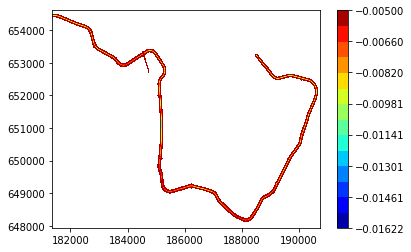

In [21]:
ax = plt.subplot(111)

levels = np.linspace(dfout.z.min(),-0.005,15)

# Dividi la tratta principale in sotto tratte
divideinpiece = 10

rangetofor = np.arange(0,dfout.shape[0],int(dfout.shape[0]/divideinpiece))[1:] # escludi lo 0
iprev = 0


for i in rangetofor:
    
    dfo = dfout.iloc[iprev:i,:]
    
    X = dfo.easting_perp
    Y = dfo.northing_perp
    Z = dfo.z

    pl1 = ax.tricontourf(X.ravel(), Y.ravel(), Z.ravel(), levels=levels, cmap="jet")
    
    
    
    iprev = i

cbar = plt.colorbar(pl1)

plt.show()


#### PROVA PLOT CONTOUR PREVIA GRID

In [ ]:
# ax = plt.subplot(111)

# ax.plot(dfout.easting_perp,dfout.northing_perp)


dfsplit = dfout.iloc[:200,:]

Z = dfsplit.pivot_table(index='easting_perp', columns='northing_perp', values='z').T.values

X_unique = np.sort(dfsplit.easting_perp.unique())
Y_unique = np.sort(dfsplit.northing_perp.unique())
X, Y = np.meshgrid(X_unique, Y_unique)


fig = plt.figure()
ax = fig.add_subplot(111)


cpf = ax.contourf(X,Y,Z, cmap='jet')

plt.show()



#### CODICE PER VERIFICARE GLI OUTPUT

In [ ]:
ax1 = plt.subplot(111)
ax1.plot(dfout.x1, dfout.x2)
ax1.plot(df1.Easting, df1.Northing,'-')
#
vu0 = np.array(df1.iloc[0,0:2])    # vector riga 1
vu1 = np.array(df1.iloc[1,0:2])  # vector riga 2
vu2 = np.array(df1.iloc[2,0:2])  # vector riga 3
#
vdiff = vu0-vu2
nv = vdiff+vu2
ax1.plot([nv[0],vu2[0]],[nv[1],vu2[1]],color='blue')
#
vdiffnorm = vdiff/np.linalg.norm(vdiff)
vperp = perpendicular(vdiff)
vnorm = vperp/np.linalg.norm(vperp)
nn = vnorm+vu1
ax1.plot([nn[0],vu1[0]],[nn[1],vu1[1]],color='red')
#
ax1.plot([vu0[0],vu2[0]],[vu0[1],vu2[1]],color='green')

## SOUTH

In [ ]:
#######  INPUT NECESSARI  ###########

de = 7.5
k = 0.45
m = 1
Vloss = 0.01
Vs = np.pi * (de/2)**2 * Vloss

######   INPUT PER LA DISCRETIZZAZINE #########

to_i_div = 10   # num segementi tra centro e i
from_i_div = 10 # num segmenti tra i e fine gaussiana
centr_dist = 20 # numero segmenti tra i due tunnel

######  CARICO IL FILE CSV ##############

df0 = pd.read_csv("DATA//SOUTH.csv",sep=';')
# Seleziona le colonne che servono (easting,northing,elevat_diff, dist_assi, quota_PC)
df1 = df0.iloc[:,[2,3,6,7,4]]
# Calcolo dei punti di inflessione i = k * elev_diff
df1['i_point'] = k*df1[df1.columns[-3]]


#######  CARICO LE FUNZIONI ######

### bisogna rifare il kernel da zero
###  controllare     from main_def import *

##### def create_subs_df(vu0,vu1,vu2,i_point,Vs,dist,from_i_div,to_i_div,centr_dist)

dfout = pd.DataFrame(columns=['xloc', 'z', 'easting_perp', 'northing_perp','z1','z2'])

for i in range(df1.shape[0]-2):
    vu0 = np.array(df1.iloc[i,0:2])    # vector riga 1
    vu1 = np.array(df1.iloc[i+1,0:2])  # vector riga 2
    vu2 = np.array(df1.iloc[i+2,0:2])  # vector riga 3
    i_point = np.array(df1.iloc[i+1,2])
    dist    = np.array(df1.iloc[i+1,3])*-1   #perché la distanza di input è negativa
    
    dfout1 = create_subs_df(vu0,vu1,vu2,i_point,Vs,dist,from_i_div,to_i_div,centr_dist)
    
    dfout = pd.concat([dfout,dfout1])

print(" il cedimento massimo calcolato e': ", dfout.z.min())

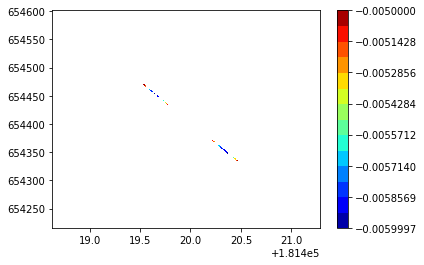

In [15]:
ax = plt.subplot(111)

levels = np.linspace(dfout.z.min(),-0.005,15)

# Dividi la tratta principale in sotto tratte
divideinpiece = 10

rangetofor = np.arange(0,dfout.shape[0],int(dfout.shape[0]/divideinpiece))[1:] # escludi lo 0
iprev = 0


for i in rangetofor:
    
    dfo = dfout.iloc[iprev:i,:]
    
    X = dfo.easting_perp
    Y = dfo.northing_perp
    Z = dfo.z

    pl1 = ax.tricontourf(X.ravel(), Y.ravel(), Z.ravel(), levels=levels, cmap="jet")
    
    
    
    iprev = i

cbar = plt.colorbar(pl1)

plt.show()

### SOUTH UNA SOLA SEZIONE

 il cedimento massimo calcolato e':  -0.005999661570549056


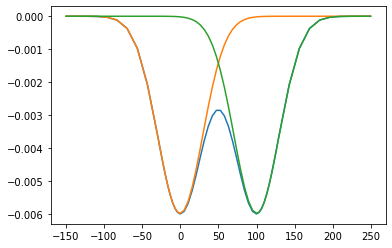

In [14]:
#######  INPUT NECESSARI  ###########

de = 7.5
k = 0.45
m = 1
Vloss = 0.01
Vs = np.pi * (de/2)**2 * Vloss

######   INPUT PER LA DISCRETIZZAZINE #########

to_i_div = 10   # num segementi tra centro e i
from_i_div = 10 # num segmenti tra i e fine gaussiana
centr_dist = 20 # numero segmenti tra i due tunnel

######  CARICO IL FILE CSV ##############

df0 = pd.read_csv("DATA//SOUTH.csv",sep=';')
# Seleziona le colonne che servono (easting,northing,elevat_diff, dist_assi, quota_PC)
df1 = df0.iloc[:,[2,3,6,7,4]].copy()

# Calcolo dei punti di inflessione i = k * elev_diff
df1['i_point'] = k*df1[df1.columns[-3]]


#######  CARICO LE FUNZIONI ######

### bisogna rifare il kernel da zero
###  controllare     from main_def import *

##### def create_subs_df(vu0,vu1,vu2,i_point,Vs,dist,from_i_div,to_i_div,centr_dist)

dfout = pd.DataFrame(columns=['xloc', 'z', 'easting_perp', 'northing_perp','z1','z2']).copy()


i=5

vu0 = np.array(df1.iloc[i,0:2])    # vector riga 1
vu1 = np.array(df1.iloc[i+1,0:2])  # vector riga 2
vu2 = np.array(df1.iloc[i+2,0:2])  # vector riga 3
i_point = np.array(df1.iloc[i+1,2])
dist    = np.array(df1.iloc[i+1,3])*-1   #perché la distanza di input è negativa

dfout1 = create_subs_df(vu0,vu1,vu2,i_point,Vs,100,from_i_div,to_i_div,centr_dist)

dfout = pd.concat([dfout,dfout1])

print(" il cedimento massimo calcolato e': ", dfout.z.min())

ax1 = plt.subplot(111)
ax1.plot(dfout.xloc, dfout.z)
ax1.plot(dfout.xloc, dfout.z1)
ax1.plot(dfout.xloc, dfout.z2)